In [1]:
import sys
sys.path.append('/mnt/labshare/Programs/python/HelperFunctions/')
from plottingFunctions import *
from scipy.linalg import expm
from scipy.constants import h, hbar, e, pi
from scipy.integrate import quad
from scipy.optimize import *

init_notebook_mode(connected=True)
from IPython.display import Image

# from wavefunction import *
# from wavefunction.wavefunction1d import *
from spectre import eigensolver

from tqdm.autonotebook import tqdm

/home/cjhowing/.conda/envs/caleb/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning:

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)



# JPM

## Hamiltonian

$$
H_{JPM} (\delta, Q) = \frac{Q^2}{2C_s} - E_j \cos{\delta} + \frac{1}{2L_g} \left( \frac{\Phi_0}{2\pi}\right)^2 \left( \delta - \frac{2\pi\Phi_{ext}}{\Phi_0} \right)^2
$$

## Potential

$$
U(\delta) = - E_j \cos{\delta} + \frac{1}{2L_g} \left( \frac{\Phi_0}{2\pi}\right)^2 \left( \delta - \frac{2\pi\Phi_{ext}}{\Phi_0} \right)^2
$$

using $\beta_L = \frac{2\pi L_g I_c}{\Phi_0}$, and $\delta_{a} = 2\pi\Phi_{ext} / \Phi_0$

$$
U(\delta)/E_j = -\cos{\delta} + 1/\beta_L \left( \delta - \delta_a \right)^2
$$

## JPM Params

In [2]:
phi0 = h/(2*e)

Lg = 1.24e-9
Cs = 3.27e-12
Ic = 1.2e-6

Ej = phi0 * Ic/(2*pi) / hbar
Lj = phi0/(2 * pi * Ic)

mm = Cs * (phi0/(2*pi))**2 * hbar

betaL = Lg/Lj

wp = (2*pi/phi0)*np.sqrt( (1/Cs) * (Ej*hbar + 1/Lg * (phi0/2/pi)**2) ) # Plasma Frequency

params = {
    'Lg': Lg,
    'Cs': Cs,
    'Ej': Ej,
    'Lj': Lj,
    'mm': mm,
    'betaL': betaL,
    'dxc': 2.36199,
    'dx': 0,
    'energy_root': None,
    'delta_l': 0,
    'delta_r': 0
}


print("BetaL: {:f}".format(betaL))
print("Ej: {:e}".format(Ej))
print("Plasma Frequency: {:e} GRad/s, {:e} GHz".format(wp/1e9, wp/2e9/pi))

BetaL: 4.521340
Ej: 3.744905e+12
Plasma Frequency: 3.690095e+01 GRad/s, 5.872968e+00 GHz


## JPM Class

In [4]:
class JPM:
    
    def __init__(self, Lg=1.24e-9, Cs=3.27e-12, I0=1.2e-6, N=1001):
        phi0 = h/(2*e)
        
        self.Lg = Lg
        self.Cs = Cs
        self.I0 = I0
        self.Ej = phi0 * self.I0/(2*pi)
        self.Lj = phi0/(2 * pi * self.I0)

        self.mm = Cs * (phi0/(2*pi))**2
        
        self.k = -hbar**2 / (2*self.mm)

        self.betaL = self.Lg/self.Lj
        
        self.dx = 0.95
        self.dxc = 6.174
        
        self.d = np.linspace(-1, 1, N) * 5 + pi
        
        
        self.u_min = 0
        self.find_bound_states()
        self.find_tps()
    ############   
    # Properties
    ############
    @property
    def delta_extrema(self):
        extrema_func = lambda x: np.sin(x) - (1/self.betaL)*(2*pi*self.delta_ex - x - pi)
        
        return optimize.brent(extrema_func, brack=[0, pi])
    
    ## Classical Plasma Frequency
    @property
    def wp_c(self):
        self.critical_points() # Make sure we've found critical points
        return np.sqrt(self.Ej/self.mm * (np.cos(self.d_min) + 1/self.betaL))
    
    ## Quantum Plasma Frequency
    @property
    def wp(self):
        return (self.Es[1] - self.Es[0])/hbar
    
    @property
    def fp(self):
        return self.wp/2/pi
    
    @property
    def f01(self):
        # F01 in GHz
        return self.wp/2e9/pi
 
    #########
    # Methods
    #########
    def U(self, En=None, show=False):
        u = -self.Ej*(np.cos(self.d) - (1/(2*self.betaL)) * (self.d - (self.dx*self.dxc) )**2)
        if show:
            LinePlot(x=self.d/pi, y=self.U()/self.Ej);
        else:
            return u
        
    def U_d(self, d, En=None, plot=False):
        # Returns potential U
        u = -self.Ej*(np.cos(d) - (1/(2*self.betaL)) * (d - (self.dx*self.dxc) )**2)
        
        if En:
            u = u - En
            
        if plot:
            LinePlot(x=self.d/pi, y=self.U()/self.Ej);
        else:
            return u
        
    def find_dxc(self):
        self.dx = 1
        self.dxc = 3
        self.critical_points()
        while self.u_min < self.u_max:
#             print("dc = {}, umin = {}, umax = {}".format(self.dxc, self.d_min, self.d_max))
            self.dxc += 0.001
            try:
                self.critical_points()
            except:
                return
            
        self.dx = 0
        
    def critical_points(self, show=False):
        
        self.d_max = fmin(lambda x: -1*self.U_d(x), [0.8*pi], disp=0)[0]
        self.d_min = fminbound(self.U_d, self.d[0], self.d_max, disp=0)
        self.d_min2 = fminbound(self.U_d, self.d_max, self.d[-1], disp=0)
        
        self.u_min2 = self.U_d(self.d_min2)
        self.u_max = self.U_d(self.d_max)  
        self.u_min = self.U_d(self.d_min)
        
        self.dU = self.u_max - self.u_min
        self.dd = self.d_max - self.d_min       
        
        if show: 
            print("Potential Maximum of {:f} at {:f}".format(self.u_max/self.Ej, self.d_max/pi))
            print("Potential Minimum of {:f} at {:f}".format(self.u_min/self.Ej, self.d_min/pi))
            print("Potential Minimum of {:f} at {:f}".format(self.u_min2/self.Ej, self.d_min2/pi)) 
            print("Barrier: dU = %f Ej" % (self.dU/self.Ej))
            print("Well spacing: dd = %f" % self.dd)

            l, tr = LinePlot(x=self.d/pi, y=self.U()/self.Ej, show=False);tr.update(name='U')
            l, tr2 = LinePlot(x=[self.d_min/pi], y=[self.u_min/self.Ej], show=False);tr2.update(mode='marker', name='U_min')
            l, tr3 = LinePlot(x=[self.d_max/pi], y=[self.u_max/self.Ej], show=False);tr3.update(mode='marker', name='U_max')
            l.update(yaxis = {'range': [0.99*self.u_min/self.Ej, 1.01*self.u_max/self.Ej], 'title': 'U/Ej'},
             xaxis = {'title': 'delta'},
                      showlegend=False)
            iplot(go.Figure(data=[tr, tr2, tr3], layout=l))
            
    def find_bound_states(self, show=False, usewavefunction=False):
        self.critical_points()
        N = len(self.d)
        nbound = 0
        boundidx = []        
        
        if usewavefunction:
            u = assemble_u_potential(N, self.U_d, self.d, (0))
            K = assemble_K(N, self.k, min(self.d), max(self.d))
            V = assemble_V(N, u, min(self.d), max(self.d))
            H = K + V
            
            evals, evecs = solve_eigenproblem(H)
        else:     
            evals, evecs, x = eigensolver(self.U_d,N=[N],domain=[[min(self.d),max(self.d)]], k_diag=[self.k])
            evecs = np.real(evecs).T
           
        for i in range(0,N):
            if evals[i] >= self.u_min and evals[i] <= self.u_max:
                if np.inner(evecs[i] * (self.d_min-2*self.dd < self.d) * (self.d < self.d_max), evecs[i]) > 0.5:
                    nbound = nbound + 1
                    boundidx.append(i)        

        self.NN = len(boundidx)
        self.Es = np.abs(evals[boundidx])
        
        self.Evecs = np.real(0.01*evecs[boundidx])
        self.find_tps()
        
        if show:
            print("Found {} bound states.".format(self.NN))
            if self.NN > 1:
                print("f01 = {} GHz".format(self.f01))  

            trs = []

            l, tr = LinePlot(x=self.d/pi, y=self.U()/self.Ej, show=False);tr.update(name="U")
            trs.append(tr)
            for i in range(self.NN):
                y = self.Evecs[i] + self.Es[i]/self.Ej
                l, tr = LinePlot(x=self.d/pi, y=y, show=False)
                tr.update(name=str(i))
                trs.append(tr)
            
            trs.append(go.Scatter(x=np.array([self.d_min, self.d_max, self.d_min2])/pi, 
                                    y=np.array([self.u_min, self.u_max, self.u_min2])/self.Ej,
                                    mode='markers'))
            
            l.update(yaxis = {'range': [0.99*self.u_min/self.Ej, 1.01*self.u_max/self.Ej], 'title': 'U/Ej'},
                     xaxis = {'title': 'delta'},
                              showlegend=False)
            iplot(go.Figure(data=trs, layout=l))
            
    def find_tps(self):
        tps = []
        for E in self.Es:
            roots = fsolve(self.U_d, (0, pi/2, pi), (E))
            tps.append(roots[1:])
        self.tps = tps
    
    def action_integrand(self, d, n):
        return np.sqrt(2*self.mm * np.abs(self.U_d(d) - self.Es[n]))
    
    def action_integral(self, n):
        return  quad(self.action_integrand, *self.tps[n], args=(n))[0]
    
    def tunneling_rate(self, n):
        f = lambda n: (np.sqrt(2*pi)/ np.math.factorial(n)) * ((n+0.5)/np.e)**(n+0.5)

        S = self.action_integral(n)
        gamma = (self.wp_c/(2*pi)) * f(n) * np.exp(-S/hbar)

        return gamma
    
    def plot_gammas(self, n=3, dxs=np.linspace(0.9, 0.97, 5), show=True):
        
        gammas = [[] for i in range(n)]

        for dx in tqdm(dxs):
            self.dx = dx
            self.find_bound_states()

            for ii, g in enumerate(gammas):
                if ii < len(self.Es):
                    gammas[ii].append(self.tunneling_rate(ii))
                else:
                    gammas[ii].append(np.NaN)
                
        if show:
            trs = []

            for i, g in enumerate(gammas):
                l, tr = LinePlot(x=dxs, y=g, show=False)
                tr.update(name='Gamma {}'.format(i))
                trs.append(tr)
                
            l.update(yaxis={'type': 'log', 'exponentformat': 'e'})
            iplot(go.Figure(data=trs, layout=l)); 
            
            trs = []
            for i, g in enumerate(gammas):
                if i>0:
                    l, tr = LinePlot(x=dxs, y=np.divide(gammas[i], gammas[0]), show=False)
                    tr.update(name='Gamma_{}/Gamma_0'.format(i))
                    trs.append(tr)

            l.update(yaxis={'type': 'log', 'exponentformat': 'e'})
            iplot(go.Figure(data=trs, layout=l)); 
            
        return gammas

In [5]:
j1 = JPM()

Found 19 bound states.
f01 = 3.833803517540728 GHz


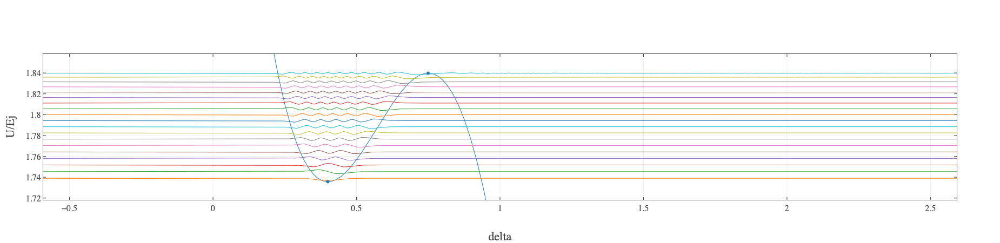

In [6]:
j1.dx = 0.9
j1.find_bound_states(show=True)

A Jupyter Widget

/home/cjhowing/.conda/envs/caleb/lib/python3.6/site-packages/scipy/optimize/minpack.py:161: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.



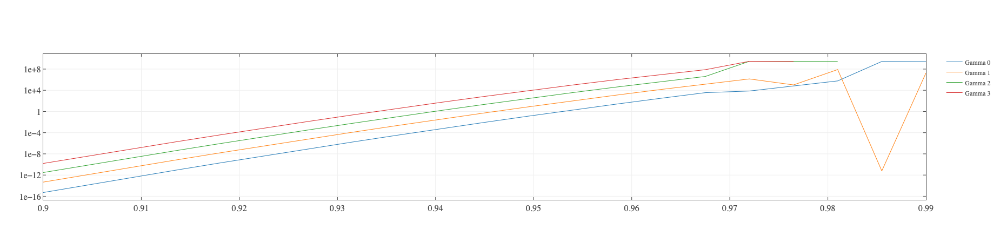

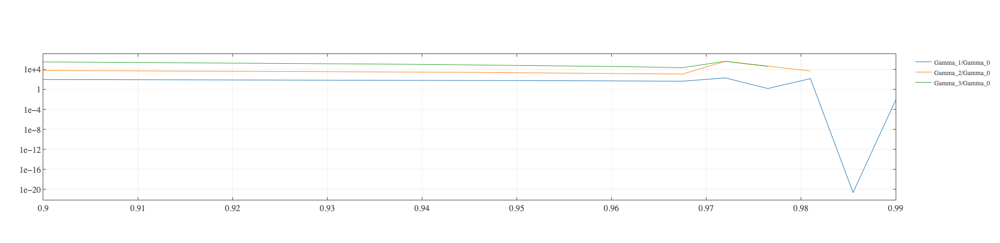

In [5]:
j1.plot_gammas(4, np.linspace(0.9, 0.99, 21));

### Potential

In [1296]:
params['dx']

0.98999999999999999

In [8]:
k = -hbar**2 / (2*mm)

def U(d, params, En=None):
    u = -params['Ej']*(np.cos(d) - (1/(2*params['betaL'])) * (d - params['dx']*params['dxc'] -pi )**2)
    if En:
        u = u - En
            
    return u

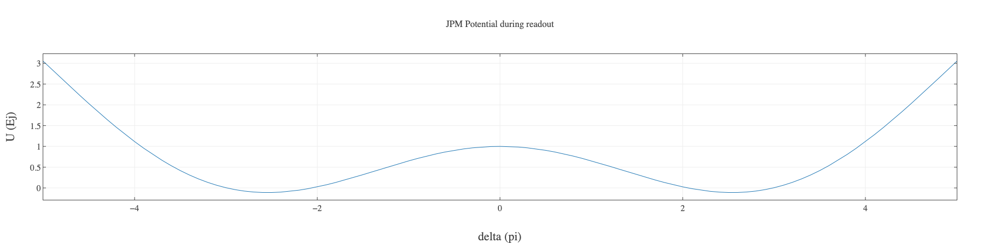

In [10]:
params['dx']= 0
d = np.linspace(-1, 1, 101) * 5 + pi
l, tr = LinePlot("JPM Potential during readout", x=d-pi, y=U(d, params)/Ej, layoutOpts={'xaxis': {'title': "delta (pi)"}, 'yaxis': dict(title="U (Ej)")})

## Mutual Calculation

In [755]:
phi0 / (2*pi) / iu

NameError: name 'iu' is not defined

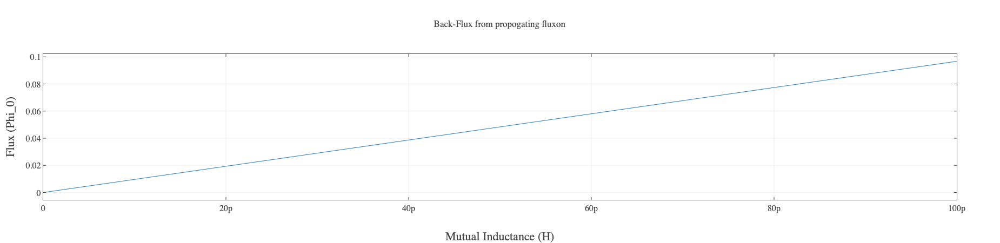

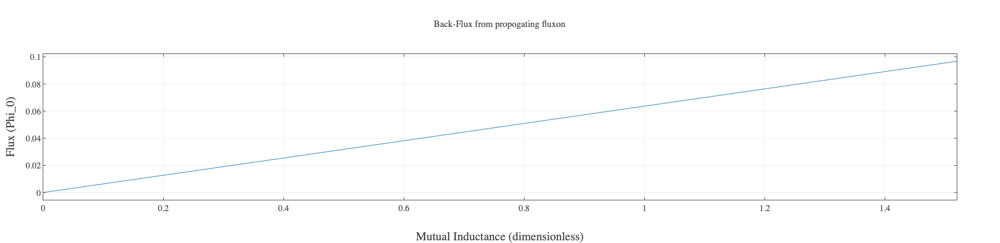

In [205]:
ms = np.linspace(0, 100, 101)*1e-12
ic = 2e-6 # JTL Junction Ic
iu = 5e-6 # PSCAN Converter

LinePlot(x=ms, y=ms*ic/phi0, title="Back-Flux from propogating fluxon", layoutOpts={'xaxis': {'title': "Mutual Inductance (H)"},
                                                                                   'yaxis': {'title': "Flux (Phi_0)"}});

mspscan = ms/(phi0 / (2*pi) / iu)
LinePlot(x=mspscan, y=ms*ic/phi0, title="Back-Flux from propogating fluxon", layoutOpts={'xaxis': {'title': "Mutual Inductance (dimensionless)"},
                                                                                   'yaxis': {'title': "Flux (Phi_0)"}});

Assuming a 'worst case' scenario, where the flux added to the JPM is 0.1$\Phi_0$.

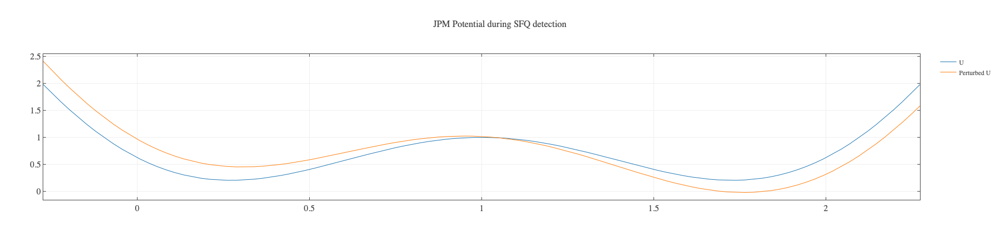

In [264]:
phiba = 0.05 # Back action flux

u = U(d, 1/2)

l, tr = LinePlot(x=d/pi, y=U(d, 1/2), show=False);tr.update(name='U')
l, tr2 = LinePlot(x=d/pi, y=U(d, 1/2+phiba), show=False);tr2.update(name='Perturbed U')
l.update(title="JPM Potential during SFQ detection")
iplot(go.Figure(data=[tr, tr2],layout=l))

## Tunneling Rates

### Photodetection

Calculate tunneling rates for various excitation levels in left well as a function of bias.

### Critical points

In [902]:
 params['dxc']

2.36199

In [15]:
d = np.linspace(-1, 1, 1001) * 4 + pi
params['dx'] = 1.1

def find_critical_points(show=False):
    
    d_max = fmin(lambda x, args: -U(x, args), [pi], (params,), disp=0)[0]
    u_max = U(d_max, params)/Ej
    if show: print("Maximum of {:f} at {:f}".format(u_max, d_max))
        
    d_min = fminbound(U, 0, d_max, (params,), disp=0)
    u_min = U(d_min, params)/Ej
    if show: print("Minimum of {:f} at {:f}".format(u_min, d_min))

    dU = u_max - u_min
    dd = d_max - d_min

    if show: print("Barrier: dU = %f Ej" % (dU))

    if show:
        l, tr = LinePlot(x=d/pi, y=U(d, params)/Ej, show=False);tr.update(name='U')
        l, tr2 = LinePlot(x=[d_min/pi], y=[u_min], show=False);tr2.update(mode='marker', name='U_min')
        l, tr3 = LinePlot(x=[d_max/pi], y=[u_max], show=False);tr3.update(mode='marker', name='U_max')

        iplot(go.Figure(data=[tr, tr2, tr3], layout=l))
    return d_min, d_max

d_min, d_max = find_critical_points(show=True)

NameError: name 'U' is not defined

In [1506]:
d_max

2.3784496452500257

In [1371]:
def plasma_freq(d, params):
    return (2*pi/phi0) * np.sqrt(hbar * params['Ej']/params['Cs'] * (np.cos(d) + 1/params['betaL']))

plasma_freq(d_min, params) / 2e9/pi

4.1494044700762922

In [1373]:
params['wp']/ 2e9/pi

3.5318249742011623

### Find bound states

In [769]:
def find_bound_states(d, params, show=False):

    N = len(d)

    u = assemble_u_potential(N, U, d, params)
    K = assemble_K(N, k, min(d), max(d))
    V = assemble_V(N, u, min(d), max(d))
    H = K + V

    evals, evecs = solve_eigenproblem(H)


    nbound = 0
    boundidx = []

    for i in range(0,N):
        if evals[i]/params['Ej'] >= u_min and evals[i]/params['Ej'] <= u_max:
            if np.inner(evecs[i] * (d_min-2*dd < d) * (d < d_max), evecs[i]) > 0.5:
                nbound = nbound + 1
                boundidx.append(i)

    NN = len(boundidx)

    if show:
        print("Found {} bound states.".format(NN))

        print("f01 = {} GHz".format((np.real(evals[boundidx[1]] - evals[boundidx[0]]))  / 2e9 / pi))

    
    Es = np.real(evals[boundidx])
    Evecs = np.real(0.01*evecs[boundidx])
    return NN, Es, Evecs

NN, Es, Evecs = find_bound_states(d, params, show=True);

Found 27 bound states.
f01 = 4.123873682687638 GHz



Plot first few bound states.

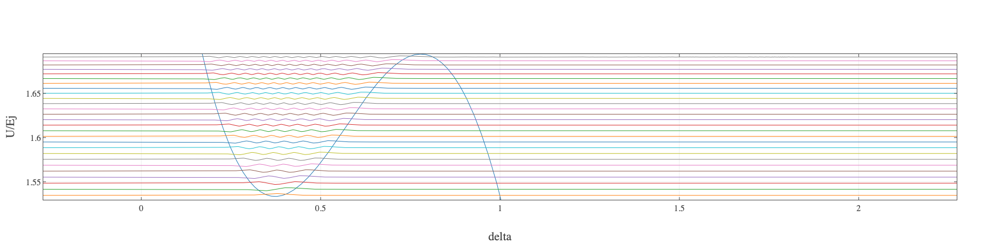

In [790]:
ns = NN

trs = []

l, tr = LinePlot(x=d/pi, y=u/params['Ej'], show=False);tr.update(name="U")
trs.append(tr)
for i in range(ns):
    y = Evecs[i] + Es[i]/params['Ej']
    l, tr = LinePlot(x=d/pi, y=y, show=False)
    tr.update(name=str(i))
    trs.append(tr)
    
l.update(yaxis = {'range': [0.999*u_min, 1.001*u_max], 'title': 'U/Ej'},
         xaxis = {'title': 'delta'},
                  showlegend=False)
iplot(go.Figure(data=trs, layout=l))

### Turning points $\delta_1$ and $\delta_2$

In [760]:
def find_tps(U, Es):
    tps = []
    for E in Es:
        roots = fsolve(U, (0.25*pi, 0.5*pi), (params, E))
        tps.append(roots/pi)
    return tps

tps = find_tps(U, Es)

In [1107]:
print("Turning points at d1={:.3f} and d2={:.3f}.".format(*tps[0]))

Turning points at d1=0.340 and d2=0.408.


### Action Integral

$$
S_n = \int_{\delta_1}^{\delta_2}\sqrt{2m | E_n - U(\delta)|} \; d \delta
$$

In [1313]:
def integrand(d, params):
    
    return np.sqrt(2 * params['mm'] * abs((n+0.5)*params['wp']*hbar - U(d, params)*hbar))

def action_integral(n, tps, params):

    return quad(integrand, tps[0]*pi, tps[1]*pi, (params))[0].real

In [1320]:
# params['wp'] = Es[1] - Es[0]

n=2
S0 = action_integral(n, tps[n], params)
print(S0/hbar)
print(params['wp']/2e9/pi)
gamma = params['wp']/2/pi * f(n) * np.exp(-S0/hbar)
print("{:e}, {}".format(gamma, 1/gamma))

9.327123065248112e-16
3.5318249742
3.590649e+09, 2.785012003581979e-10


### Tunneling Rate

$$
\Gamma_n = \frac{\omega_0}{2\pi} f_n \exp{( -S_n /\hbar )},
$$

where correction factor 

$f_n = \frac{\sqrt{2\pi}}{n!} \left(\frac{n+1/2}{e}\right)^{n+1/2}$

gives a small correction of $f_0=1.075$.

In [14]:
n=1

def tunneling_rate(n, tps, params):
    f = lambda n: (np.sqrt(2*pi)/ np.math.factorial(n)) * ((n+0.5)/np.e)**(n+0.5)

    S = action_integral(n, tps[n], params)
    gamma = params['wp']/2/pi * f(n) * np.exp(-S)

    return gamma

d_min, d_max = find_critical_points()
wp = plasma_freq(d_min, params)
params['wp'] = wp
print("Plasma Frequency: {} GHz".format(wp/2e9/pi))
gamma = tunneling_rate(n,  tps, params)
print("Tunneling Rate = {:e} GHz".format(gamma/1e9))

tp = 5e-9
prob = gamma * tp
print("Tunneling Probability = {:e}".format(prob))
print("Non-QNDness = {:.4f}%".format((1-prob)*100))

NameError: name 'find_critical_points' is not defined

In [1278]:
U(tps[1]*pi, params)

array([  6.27919972e+12,   6.27919972e+12])

In [681]:
(Es[1]-Es[0])/1e9

22.155379274483398

## Frequency vs. Flux

In [678]:
fluxes = np.linspace(2.2, 2.35, 11)
wps = []

for flux in tqdm(fluxes):
    params['dx'] = flux
    num_bound, Es, Evecs = find_bound_states(d, params)
    wps.append((Es[1] - Es[0])/2/pi)
    
LinePlot(x=fluxes, y=wps);

A Jupyter Widget

## Loaded JPM

Calculate same tunneling rates as above, with modified potential due to coupling to JTL.

Model initially as coupling to a single JTL cell, so two coupled rf-SQUIDS.


### Hamiltonian

$$
H(\delta_i, Q_i) = \sum_{i=1}^2{\left[ \frac{Q_i^2}{2m_i} - E_{J_i}\cos{\delta_i}\right]} - \left(\frac{\Phi_0}{2\pi}\right)^2 \left( \frac{L_1L_2}{L_1L_2-M^2} \right) \left[ \frac{1}{L_1}(\delta_1 - \delta_{x_1})^2 + \frac{1}{L_2}(\delta_2 - \delta_{x_2})^2 + \frac{2M}{L_1L_2}(\delta_1 - \delta_{x_1})(\delta_2 - \delta_{x_2})\right]
$$

### Potential

$$
U(\delta_1, \delta_2) = - E_{j1} \cos{\delta_1} - E_{j2} \cos{\delta_2} - \left(\frac{\Phi_0}{2\pi}\right)^2 \left( \frac{L_1L_2}{L_1L_2-M^2} \right) \left[ \frac{1}{L_1}(\delta_1 - \delta_{x_1})^2 + \frac{1}{L_2}(\delta_2 - \delta_{x_2})^2 + \frac{2M}{L_1L_2}(\delta_1 - \delta_{x_1})(\delta_2 - \delta_{x_2})\right]
$$

using $\delta_{x1} = 2\pi\Phi_{1} / \Phi_0$, $\delta_{x2} = 2\pi\Phi_{2} / \Phi_0$

### Loaded JPM Class

In [65]:
class coupledJPM(JPM):

    def __init__(self, Lg=1.24e-9, Cs=3.27e-12, I0=1.2e-6, L2=41e-12, I2=2e-6, C2=80e-15, M=10e-12, N=100):
        
        super().__init__(N=N)
        self.L2 = L2
        self.I2 = I2
        self.C2 = C2
        self.M = M
        
        self.Ej2 = phi0 * self.I2/(2*pi)
        self.Lj2 = phi0/(2 * pi * self.I2)

        self.mm2 = C2 * (phi0/(2*pi))**2
        
        self.k2 = -hbar**2 / (2*self.mm2)
        
        self.k2d = [self.k, self.k2]

        self.betaL2 = self.L2/self.Lj2
        
        self.dx2 = 0
        self.dxc2 = np.pi
        
        self.d1 = self.d
        self.d2 = np.linspace(-1, 1, N//10) * 2
        
        self.dd1, self.dd2 = np.meshgrid(self.d1, self.d2)
     
    def U2(self, En=None, show=False):
        
        u = -self.Ej2*(np.cos(self.d2) - (1/(2*self.betaL2)) * (self.d2 - (self.dx2*self.dxc2) )**2)
        if show:
            LinePlot(x=self.d2/pi, y=self.U2()/self.Ej2);
        else:
            return u

    def U2d(self, d1=None, d2=None, show=False):
        
        pref = (phi0/2/pi)**2 * (self.Lg * self.L2)/(self.Lg*self.L2 - self.M**2)
        
        if (d1 is None) and (d2 is None):
            d1 = self.dd1
            d2 = self.dd2
        elif d1 is None:
            d1 = self.d1
        elif d2 is None:
            d2 = self.d2
#         u = -self.Ej*(np.cos(self.d) - (1/(2*self.betaL)) * (self.d - (self.dx*self.dxc) )**2)
        u = -self.Ej*np.cos(d1) + \
            -self.Ej2*np.cos(d2) + \
            pref*(1/(2*self.Lg) * (d1 - self.dx*self.dxc )**2 + \
                  1/(2*self.L2) * (d2 - self.dx2*self.dxc2 )**2 + \
                  self.M / (self.Lg * self.L2)*(d1 - self.dx*self.dxc)*(d2 - self.dx2*self.dxc2))

        if show:
            if (np.size(d1) > 1) and (np.size(d2) > 1):
                iplot(go.Figure(data=[go.Contour(x=self.d1, y=self.d2, z=u/self.Ej)], 
                                layout=dict(autosize='False',
                                           xaxis={'title': 'delta_1'},
                                           yaxis={'title': 'delta_2'},
                                           width=500,
                                           height=500)))
            elif np.size(d1) == 1:
                LinePlot(x=d2/np.pi, y=u/self.Ej2, show=True);
            elif np.size(d2) == 1:
                LinePlot(x=d1/np.pi, y=u/self.Ej, show=True);
            
        return u
            
    def U2_d(self, d1, d2):
        
        pref = (phi0/2/pi)**2 * (self.Lg * self.L2)/(self.Lg*self.L2 - self.M**2)
        
        u = -self.Ej*np.cos(d1) + \
            -self.Ej2*np.cos(d2) + \
            pref*(1/(2*self.Lg) * (d1 - self.dx*self.dxc )**2 + \
                  1/(2*self.L2) * (d2 - self.dx2*self.dxc2 )**2 + \
                  self.M / (self.Lg * self.L2)*(d1 - self.dx*self.dxc)*(d2 - self.dx2*self.dxc2))
        return u
    
    def find_critical_points2D(self, show=False):
        
        # Assume d2 = 0
        
        self.d_b = fmin(lambda x: -1*self.U2_d(x, 0), [0.8*pi], disp=0)[0]
        self.d_lw = fminbound(self.U2_d, self.d1[0], self.d_b, disp=0, args=(0,))
        self.d_rw = fminbound(self.U2_d, self.d_b, self.d1[-1], disp=0, args=(0,))
        
        self.u_rw = self.U2_d(self.d_rw, d2=0)
        self.u_b = self.U2_d(self.d_b, d2=0)  
        self.u_lw = self.U2_d(self.d_lw, d2=0)
        
        self.dU2 = self.u_b - self.u_lw
        self.dd2 = self.d_rw - self.d_lw       
        
        if show: 
            print("Potential Maximum of {:f} at {:f}".format(self.u_b/self.Ej, self.d_b/pi))
            print("Potential Minimum of {:f} at {:f}".format(self.u_lw/self.Ej, self.d_lw/pi))
            print("Potential Minimum of {:f} at {:f}".format(self.u_rw/self.Ej, self.d_rw/pi)) 
            print("Barrier: dU = %f Ej" % (self.dU2/self.Ej))
            print("Well spacing: dd = %f" % self.dd2)

            l, tr = LinePlot(x=self.d1/pi, y=self.U2d(d2=0)/self.Ej, show=False);tr.update(name='U')
            l, tr2 = LinePlot(x=[self.d_lw/pi], y=[self.u_lw/self.Ej], show=False);tr2.update(mode='marker', name='U_lw')
            l, tr3 = LinePlot(x=[self.d_b/pi], y=[self.u_b/self.Ej], show=False);tr3.update(mode='marker', name='U_b')
            l.update(yaxis = {'range': [0.99*self.u_lw/self.Ej, 1.01*self.u_b/self.Ej], 'title': 'U/Ej'},
             xaxis = {'title': 'delta'},
                      showlegend=False)
            iplot(go.Figure(data=[tr, tr2, tr3], layout=l))        
    
    def find_bound_states2D(self, show=False, usewavefunction=False):
        self.find_critical_points2D()
        N = len(self.d)
        
        nbound = 0
        boundidx = []        
           
        evals, evecs, x = eigensolver(self.U2_d,N=[len(self.d1),len(self.d2)],domain=[[min(self.d1),max(self.d1)],[min(self.d2),max(self.d2)]], k_diag=self.k2d)
           
        self.Evecs2 = []
        for i in range(0,len(evals)):
            if evals[i] >= self.u_lw and evals[i] <= self.u_b:
                print(i)
                evec0 = evecs[i].reshape(tuple(map(len, x)))
                self.Evecs2.append(evec0[:,len(x[1])//2])
#                 if np.inner(evec0[:,len(self.d2)//2] * (self.d_lw-2*self.dd < self.d) * (self.d < self.d_b), evec0[:,len(self.d2)//2]) > 0.5:
                nbound = nbound + 1
                boundidx.append(i)       

        self.NN2 = len(boundidx)
        self.Es2 = evals[boundidx]
        
#         self.Evecs2 = np.abs(evecs[:,boundidx])
        self.find_tps()
        
        if show:
            print("Found {} bound states.".format(self.NN2))
            if self.NN > 1:
                print("f01 = {} GHz".format(self.f01))  

            trs = []

            l, tr = LinePlot(x=self.d/pi, y=self.U2d(d2=0)/self.Ej, show=False);tr.update(name="U")
            trs.append(tr)
            for i in range(self.NN2):
                y = self.Evecs2[i] + self.Es2[i]/self.Ej
                l, tr = LinePlot(x=self.d1/pi, y=y, show=False)
                tr.update(name=str(i))
                trs.append(tr)
            
            trs.append(go.Scatter(x=np.array([self.d_lw, self.d_b, self.d_rw])/pi, 
                                    y=np.array([self.u_lw, self.u_b, self.u_rw])/self.Ej,
                                    mode='markers'))
            
            l.update(yaxis = {'range': [0.99*self.u_lw/self.Ej, 1.01*self.u_b/self.Ej], 'title': 'U/Ej'},
                     xaxis = {'title': 'delta'},
                              showlegend=False)
            iplot(go.Figure(data=trs, layout=l))

    def find_bound_states2D2(self, show=False, usewavefunction=False):
        self.find_critical_points2D()
        N = len(self.d)
        nbound = 0
        boundidx = []        

        evals, evecs, x = eigensolver(self.U2_d,N=[len(self.d1),1],domain=[[min(self.d1),max(self.d1)],[-0.001, 0.001]], k_diag=self.k2d)
        evecs = np.real(evecs).T

        for i in range(0,N):
            if evals[i] >= self.u_lw and evals[i] <= self.u_b:
                if np.inner(evecs[:,i] * (self.d_lw-2*self.dd < self.d1) * (self.d1 < self.d_rw), evecs[:,i]) > 0.5:
                    nbound = nbound + 1
                    boundidx.append(i)        

        self.NN2 = len(boundidx)
        self.Es2 = np.abs(evals[boundidx])
        
        self.Evecs2 = np.real(0.01*evecs[:,boundidx])
        self.find_tps()
        
        if show:
            print("Found {} bound states.".format(self.NN2)) 

            trs = []

            l, tr = LinePlot(x=self.d1/pi, y=self.U2_d(self.d1, d2=0)/self.Ej, show=False);tr.update(name="U")
            trs.append(tr)
            for i in range(self.NN2):
                y = self.Evecs2[i] + self.Es2[i]/self.Ej
                l, tr = LinePlot(x=self.d1/pi, y=y, show=False)
                tr.update(name=str(i))
                trs.append(tr)
            
            trs.append(go.Scatter(x=np.array([self.d_lw, self.d_b, self.d_rw])/pi, 
                                    y=np.array([self.u_lw, self.u_b, self.u_rw])/self.Ej,
                                    mode='markers'))
            
            l.update(yaxis = {'range': [0.99*self.u_lw/self.Ej, 1.01*self.u_b/self.Ej], 'title': 'U/Ej'},
                     xaxis = {'title': 'delta'},
                              showlegend=False)
            iplot(go.Figure(data=trs, layout=l))

Found 19 bound states.
f01 = 3.8338035175421474 GHz


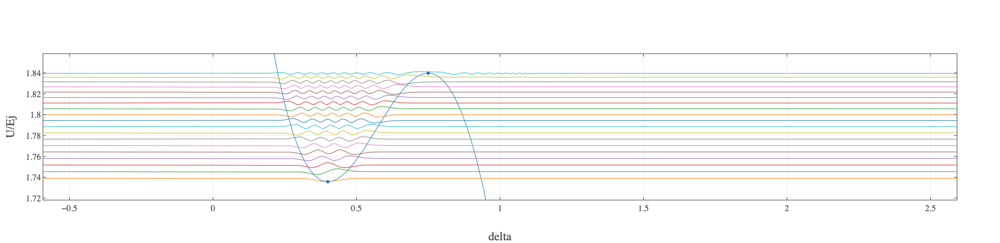

Found 0 bound states.


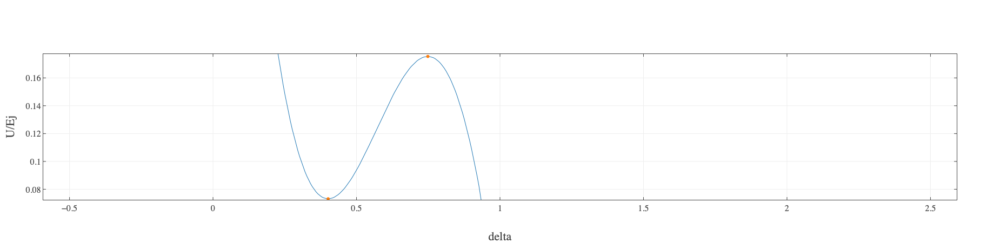

In [67]:
j2 = coupledJPM(L2=40e-12, C2=80e-15, I2=2e-6, N=500, M=10e-12)
# j2 = coupledJPM(L2=1000e-12, C2=3e-12, I2=1e-6, N=100, M=0e-12)
# j2.dx = (pi)/j2.dxc
j2.dx = 0.9
j2.dx2 = 0/j2.dxc2/2
# z = j2.U2d(show=True)
j2.find_bound_states(show=True)
# j2.find_critical_points2D(show=True)
j2.find_bound_states2D2(show=True)

$\delta_2$ only changes 0.04 rad from the left to the right well. Assuming constant.

Compare Josephson Energies:

In [1000]:
j2.Ej2/j2.Ej

1.6666666666666667

Look at changes to kinetic term.

In [998]:
j2.mm/j2.mm2

40.875

Solve 2D Hamiltonian

In [56]:
N = 250

In [1396]:
j2.dx = 0.8

In [63]:
evals, evecs, x = eigensolver(j2.U2_d,N=[N,N/10],domain=[[min(j2.d),max(j2.d)],[-2,2]], k_diag=j2.k2d)

In [58]:
j2.d2

array([-2.        , -1.91836735, -1.83673469, -1.75510204, -1.67346939,
       -1.59183673, -1.51020408, -1.42857143, -1.34693878, -1.26530612,
       -1.18367347, -1.10204082, -1.02040816, -0.93877551, -0.85714286,
       -0.7755102 , -0.69387755, -0.6122449 , -0.53061224, -0.44897959,
       -0.36734694, -0.28571429, -0.20408163, -0.12244898, -0.04081633,
        0.04081633,  0.12244898,  0.20408163,  0.28571429,  0.36734694,
        0.44897959,  0.53061224,  0.6122449 ,  0.69387755,  0.7755102 ,
        0.85714286,  0.93877551,  1.02040816,  1.10204082,  1.18367347,
        1.26530612,  1.34693878,  1.42857143,  1.51020408,  1.59183673,
        1.67346939,  1.75510204,  1.83673469,  1.91836735,  2.        ])

In [61]:
np.shape(j2.d1)

(500,)

In [ ]:
j2 = 

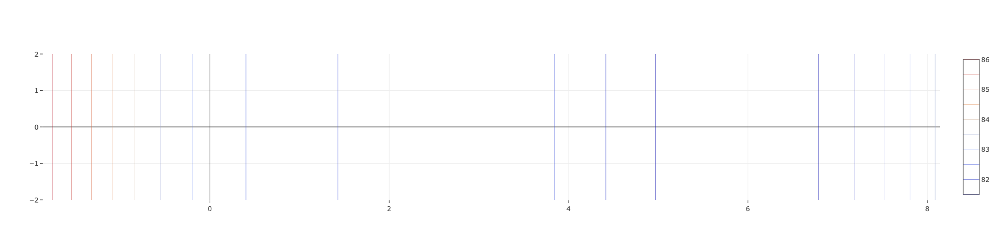

In [64]:
potential = go.Contour(x=j2.d1, y=j2.d2, z=j2.U2_d(d1=j2.dd1,d2=j2.dd2)/j2.Ej, contours=dict(
            coloring='lines',
        ),)

eplot = go.Heatmap(x=x[0], y=x[1], z=evecs[:,0].reshape(N, N//10).T, showscale=False)

# iplot(go.Figure(data=[go.Heatmap(x=x[0], y=x[1], z=evecs[:,5].reshape(N, N//10).T)]))
iplot(go.Figure(data=[potential]))

In [51]:
len(j2.d2)

50

In [1289]:
LinePlot(x=np.arange(len(evals)), y=evals/j2.Ej);

In [13]:
U_slice = lambda x: j2.U2_d(x, d2=0)

In [15]:
U_slice(j2.d1)

(500,)

In [31]:
evals, evecs, x = eigensolver(j2.U2_d,N=[len(j2.d1),1],domain=[[min(j2.d1),max(j2.d1)],[-0.001, 0.001]], k_diag=j2.k2d)

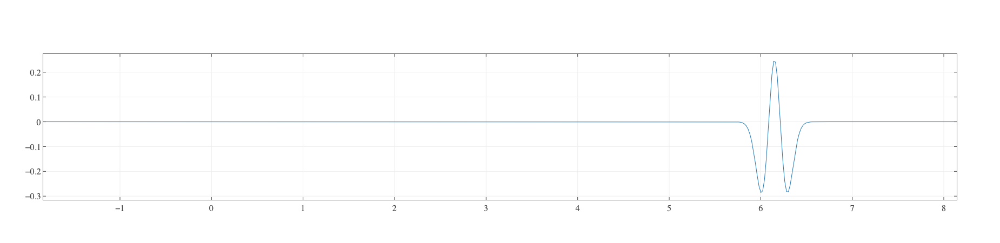

In [40]:
LinePlot(x=x[0], y=evecs[:,2]);

In [43]:
np.shape(evals)

(500,)

In [70]:
(2*pi/phi0) * np.sqrt((j2.Ej2/j2.C2) * (1 + 1/j2.betaL2))/2e9/pi

99.19623072099246